# Decision Tree

In [1]:
import pandas as pd
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score, confusion_matrix
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline

C:\Users\arvin\anaconda3\Lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\arvin\anaconda3\Lib\site-packages\visions\backends\shared\nan_handling.py:50: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @nb.jit


In [2]:
#df=pd.read_csv('winequality-red.csv', header=None,names=['fixed acidity','volatile acidity', 'citric acid', 'residual sugar', 'chloride', 'free sulphur dioxide', 'total sulphur dioxide', 'density', 'PH','sulphate','alcohol','quality'])

In [76]:
#df.to_csv('winequality-red2.csv',index=False)

In [77]:
df=pd.read_csv('winequality-red.csv')

In [78]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chloride', 'free sulphur dioxide', 'total sulphur dioxide', 'density',
       'PH', 'sulphate', 'alcohol', 'quality'],
      dtype='object')

In [7]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [79]:
x=df.drop(columns={'quality'})

In [80]:
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chloride,free sulphur dioxide,total sulphur dioxide,density,PH,sulphate,alcohol
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4
...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2


In [81]:
y=df.quality

In [82]:
y

0       5
1       5
2       5
3       6
4       5
       ..
1594    5
1595    6
1596    6
1597    5
1598    6
Name: quality, Length: 1599, dtype: int64

In [83]:
x_train,x_test,y_train,y_test=train_test_split(x,y,train_size=0.4, random_state= 500)

In [84]:
DT=DecisionTreeClassifier()

In [85]:
DT.fit(x_train,y_train)

DecisionTreeClassifier()

In [86]:
DT.predict(x_test)

array([7, 5, 6, 5, 5, 5, 5, 5, 7, 6, 6, 5, 6, 6, 5, 6, 7, 6, 6, 6, 5, 5,
       6, 7, 6, 6, 5, 6, 5, 5, 5, 6, 6, 7, 7, 5, 6, 7, 6, 6, 6, 7, 6, 6,
       4, 5, 5, 5, 5, 5, 5, 6, 5, 5, 6, 6, 6, 6, 5, 6, 6, 5, 6, 6, 6, 6,
       7, 6, 6, 5, 6, 5, 6, 5, 5, 5, 5, 5, 6, 5, 5, 7, 6, 7, 7, 5, 4, 5,
       7, 6, 6, 8, 6, 5, 6, 7, 7, 5, 7, 7, 5, 5, 5, 5, 5, 7, 6, 5, 6, 6,
       6, 5, 5, 6, 6, 5, 5, 7, 5, 5, 6, 5, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6,
       5, 4, 6, 5, 7, 6, 6, 6, 6, 5, 5, 7, 5, 5, 5, 5, 4, 5, 7, 6, 6, 5,
       6, 6, 5, 6, 6, 4, 5, 6, 5, 6, 5, 5, 7, 6, 5, 6, 5, 5, 5, 5, 6, 5,
       4, 6, 6, 6, 5, 6, 5, 8, 6, 6, 5, 6, 6, 6, 6, 5, 4, 6, 6, 6, 6, 5,
       5, 6, 6, 7, 4, 5, 6, 5, 7, 7, 5, 6, 6, 5, 6, 6, 7, 5, 6, 5, 6, 6,
       7, 5, 6, 5, 7, 7, 7, 6, 5, 6, 5, 6, 6, 7, 7, 5, 5, 7, 6, 6, 6, 6,
       6, 6, 6, 7, 6, 7, 6, 5, 6, 6, 6, 6, 5, 6, 6, 7, 7, 5, 6, 6, 7, 5,
       6, 4, 7, 5, 7, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 5, 7, 7, 6, 5, 7, 6,
       6, 5, 5, 6, 6, 6, 5, 6, 6, 6, 6, 4, 6, 7, 5,

In [87]:
DT.score(x_test,y_test)

0.5291666666666667

In [88]:
dt_entropy=DecisionTreeClassifier(criterion="entropy")

In [89]:
dt_entropy.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy')

In [90]:
dt_entropy.score(x_test,y_test)

0.5364583333333334

In [91]:
outfile = open('dt_en_meta.dot','w')
tree.export_graphviz(dt_entropy,out_file=outfile , feature_names=x.columns)

In [92]:
sklearn.__version__

'1.3.0'

[Text(0.5277064975307446, 0.9722222222222222, 'x[10] <= 10.25\ngini = 0.655\nsamples = 639\nvalue = [3, 25, 257, 258, 86, 10]'),
 Text(0.33543139343468575, 0.9166666666666666, 'x[6] <= 62.5\ngini = 0.552\nsamples = 350\nvalue = [2, 15, 202, 117, 13, 1]'),
 Text(0.22078047835770312, 0.8611111111111112, 'x[1] <= 0.595\ngini = 0.602\nsamples = 236\nvalue = [2, 12, 115, 93, 13, 1]'),
 Text(0.130531616151835, 0.8055555555555556, 'x[9] <= 0.585\ngini = 0.594\nsamples = 140\nvalue = [1, 5, 50, 73, 10, 1]'),
 Text(0.04338142732642587, 0.75, 'x[10] <= 9.125\ngini = 0.595\nsamples = 48\nvalue = [1, 4, 25, 17, 1, 0]'),
 Text(0.012394693521835963, 0.6944444444444444, 'x[7] <= 0.998\ngini = 0.64\nsamples = 5\nvalue = [1, 2, 0, 2, 0, 0]'),
 Text(0.006197346760917982, 0.6388888888888888, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(0.018592040282753946, 0.6388888888888888, 'x[1] <= 0.52\ngini = 0.444\nsamples = 3\nvalue = [1, 0, 0, 2, 0, 0]'),
 Text(0.012394693521835963, 0.5833333333

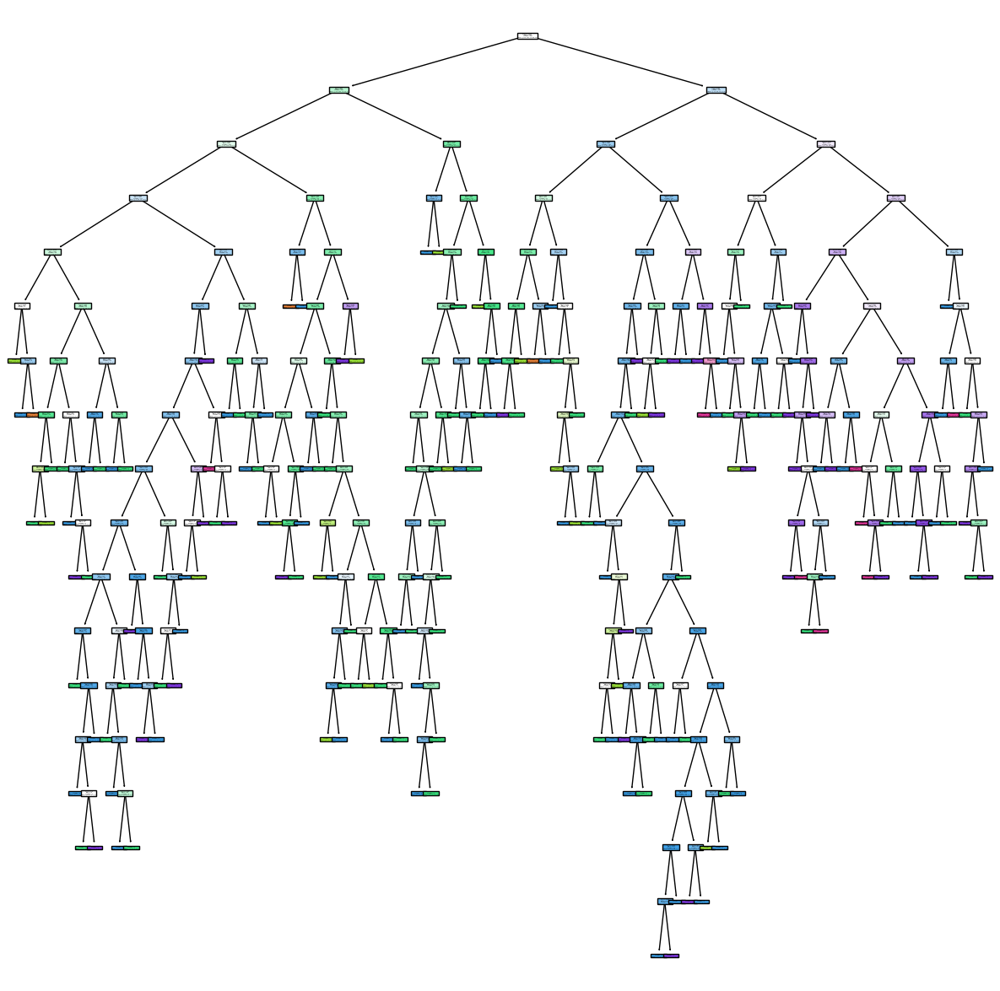

In [93]:
plt.figure(figsize=(15,15))
tree.plot_tree(DT, filled=True)

# Taking subset of the dataset to better understand the tree

In [94]:
df1=df.head(30)

In [95]:
x1=df1.drop(columns="quality")

In [96]:
y1=df1.quality

In [97]:
dt=DecisionTreeClassifier()
dt.fit(x1,y1)

DecisionTreeClassifier()

In [98]:
dt.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [99]:
dt.score(x_test,y_test)

0.40729166666666666

In [100]:
dt.score(x1,y1)

1.0

# The accuracy of the model is very low when compare with the old testing data therefore the model "dt" is over fitting model. Train accuracy is 1.0 and test accuracy is 0.39479166666666665 there is a huge difference between the train and test accuracy

[Text(0.5909090909090909, 0.9166666666666666, 'x[2] <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.36363636363636365, 0.75, 'x[6] <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.18181818181818182, 0.5833333333333334, 'x[9] <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]'),
 Text(0.09090909090909091, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]'),
 Text(0.2727272727272727, 0.4166666666666667, 'x[5] <= 6.0\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]'),
 Text(0.18181818181818182, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]'),
 Text(0.36363636363636365, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]'),
 Text(0.5454545454545454, 0.5833333333333334, 'x[5] <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]'),
 Text(0.45454545454545453, 0.4166666666666667, 'gini = 0.0\nsamples = 1\nvalue = [1, 0, 0, 0]'),
 Text(0.6363636363636364, 0.4166666666666667, 'x[1] <= 0.415\ngini = 0.091\nsamples = 21\n

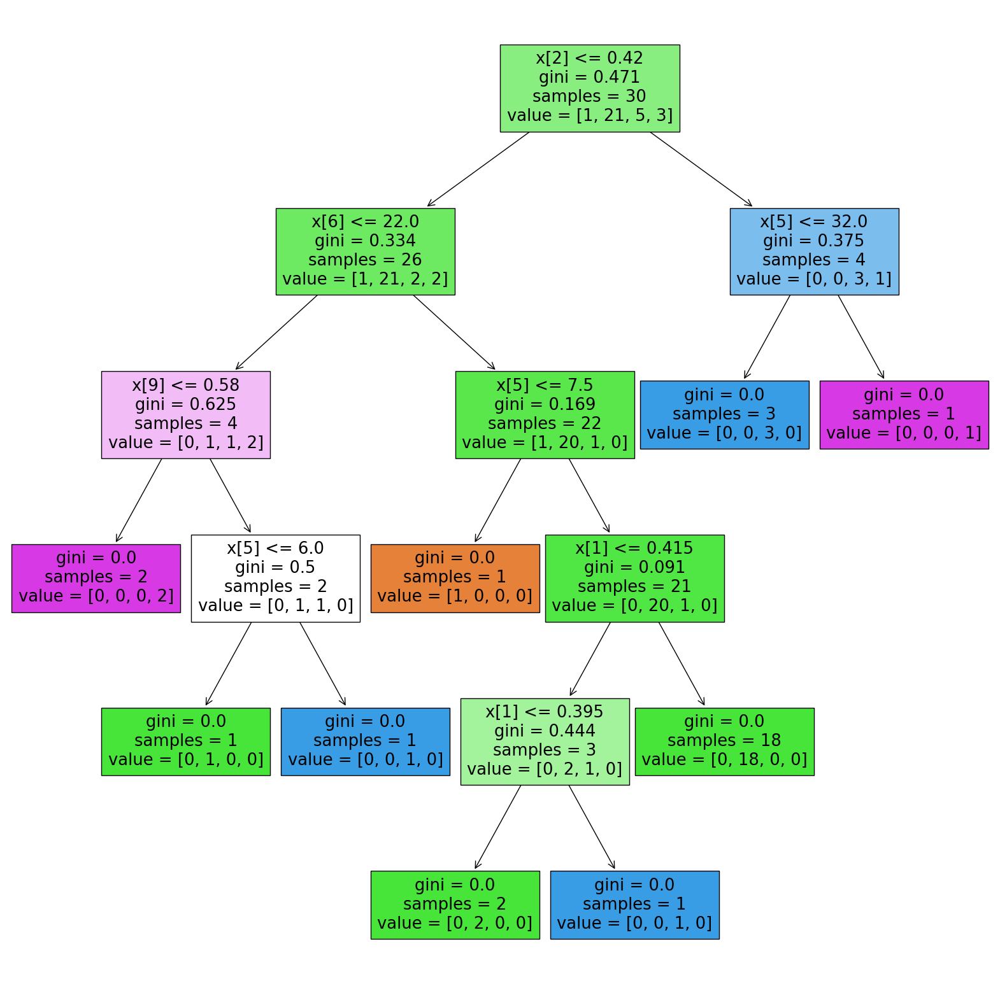

In [30]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt, filled=True)

In [101]:
set(y)

{3, 4, 5, 6, 7, 8}

In [102]:
import numpy as np
df1['citric acid'].unique()

array([0.  , 0.04, 0.56, 0.06, 0.02, 0.36, 0.08, 0.29, 0.18, 0.19, 0.28,
       0.51, 0.48, 0.31, 0.21, 0.11, 0.14, 0.16, 0.24])

In [103]:
df1['citric acid'].nunique()
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chloride', 'free sulphur dioxide', 'total sulphur dioxide', 'density',
       'PH', 'sulphate', 'alcohol', 'quality'],
      dtype='object')

In [104]:
df1['quality'].value_counts()

5    21
6     5
7     3
4     1
Name: quality, dtype: int64

In [105]:
df1['citric acid'].value_counts()

0.00    8
0.56    2
0.36    2
0.08    2
0.21    2
0.51    1
0.16    1
0.14    1
0.11    1
0.31    1
0.48    1
0.19    1
0.28    1
0.04    1
0.18    1
0.29    1
0.02    1
0.06    1
0.24    1
Name: citric acid, dtype: int64

[Text(0.5909090909090909, 0.9166666666666666, 'citric acid <= 0.42\ngini = 0.471\nsamples = 30\nvalue = [1, 21, 5, 3]\nclass = 4'),
 Text(0.36363636363636365, 0.75, 'total sulphur dioxide <= 22.0\ngini = 0.334\nsamples = 26\nvalue = [1, 21, 2, 2]\nclass = 4'),
 Text(0.18181818181818182, 0.5833333333333334, 'sulphate <= 0.58\ngini = 0.625\nsamples = 4\nvalue = [0, 1, 1, 2]\nclass = 6'),
 Text(0.09090909090909091, 0.4166666666666667, 'gini = 0.0\nsamples = 2\nvalue = [0, 0, 0, 2]\nclass = 6'),
 Text(0.2727272727272727, 0.4166666666666667, 'free sulphur dioxide <= 6.0\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0]\nclass = 4'),
 Text(0.18181818181818182, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0]\nclass = 4'),
 Text(0.36363636363636365, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0]\nclass = 5'),
 Text(0.5454545454545454, 0.5833333333333334, 'free sulphur dioxide <= 7.5\ngini = 0.169\nsamples = 22\nvalue = [1, 20, 1, 0]\nclass = 4'),
 Text(0.45454545454545453, 0.4166666666

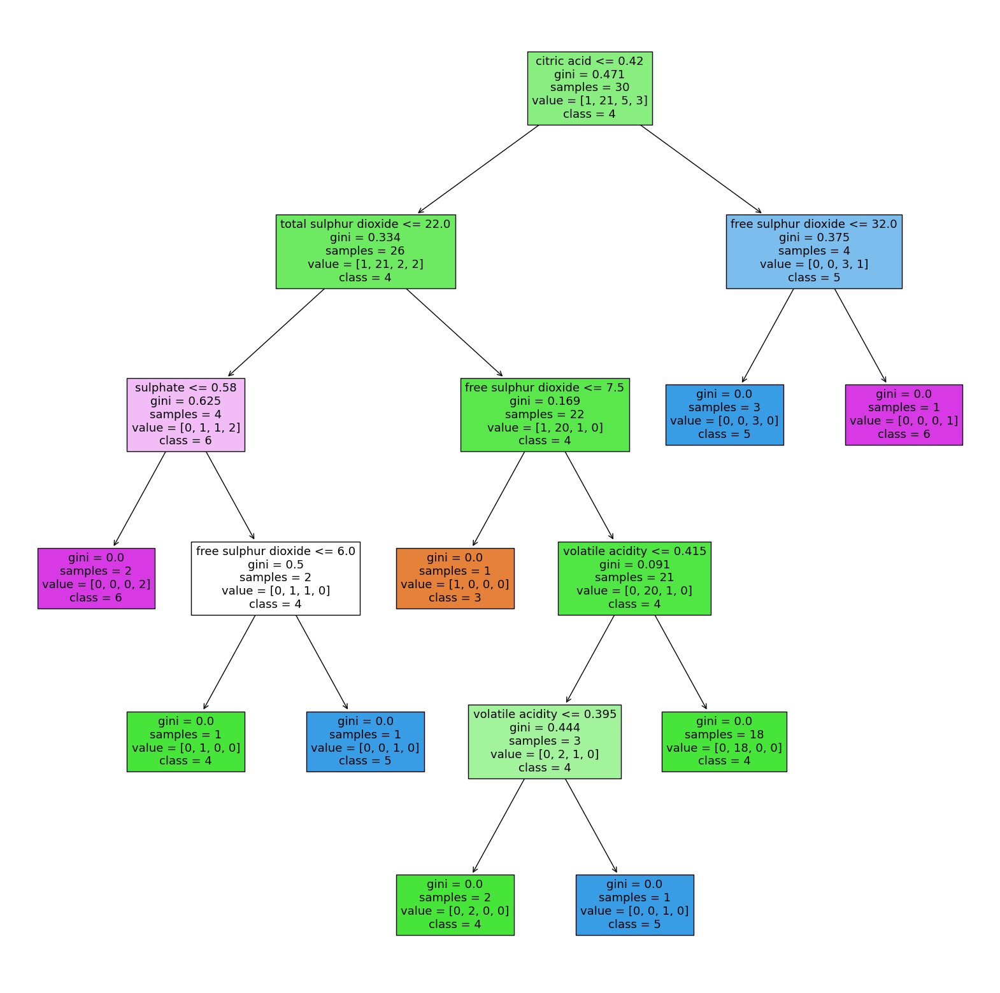

In [36]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt, filled=True,class_names=[str(i) for i in set(y)],feature_names=['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chloride', 'free sulphur dioxide', 'total sulphur dioxide', 'density',
       'PH', 'sulphate', 'alcohol'])

In [106]:
x1.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chloride', 'free sulphur dioxide', 'total sulphur dioxide', 'density',
       'PH', 'sulphate', 'alcohol'],
      dtype='object')

Volatile acidity<=0.415, gini=0.091, samples= 21, values=[0,20,1,0] , class = 4
at the above point, outoff 21 sample 20 are of #class4 and one is of #class5 hence we can remove the below branches which will reduce the complexity of the tree

# This is known as post pruning

# Pruning Operation

Cost complexity pruning (CCP) is a technique for pruning decision trees to prevent overfitting. It works by recursively removing subtrees that have a higher cost than complexity. The cost of a subtree is the training error, and the complexity is the number of terminal nodes.

The CCP algorithm can be parameterized by a hyperparameter called alpha. This parameter controls the trade-off between cost and complexity. A higher value of alpha will result in a more pruned tree, which is less likely to overfit, but may also have a higher training error.

The cost complexity pruning path of a decision tree is a sequence of decision trees, each of which is pruned to a different level using CCP. The path is generated by starting with the fully grown tree and repeatedly pruning the node with the highest cost-complexity ratio.

The cost complexity pruning path can be used to select the best pruned tree for a given dataset. One way to do this is to plot the total impurity of the leaves of the pruned trees against the effective alpha, which is a measure of the complexity of the tree. The effective alpha is calculated as the sum of the cost-complexity ratios of all the nodes that have been pruned.

The plot will typically show a curve that decreases as the effective alpha increases. This means that the trees become more pruned as the effective alpha increases. The best pruned tree is the one that has the lowest total impurity of the leaves for a given effective alpha.

Another way to select the best pruned tree is to use validation data. The validation data is a set of data that is not used to train the model, but is used to evaluate its performance. To select the best pruned tree, we can train the model on the training data and then evaluate its performance on the validation data for each tree in the cost complexity pruning path. The best pruned tree is the one that has the highest accuracy on the validation data.

The cost complexity pruning path can also be used to understand the trade-off between model complexity and model performance. As the tree is pruned, it becomes less complex, but its training error may increase. The cost complexity pruning path shows us how the training error and the validation error change as the tree is pruned. This information can be used to select a pruned tree that strikes a good balance between model complexity and model performance.

In [107]:
path=dt.cost_complexity_pruning_path(x1,y1)

In [108]:
path

{'ccp_alphas': array([0.        , 0.03174603, 0.03333333, 0.05      , 0.05      ,
        0.06075036, 0.08216783, 0.13136752]),
 'impurities': array([0.        , 0.06349206, 0.0968254 , 0.1468254 , 0.1968254 ,
        0.25757576, 0.33974359, 0.47111111])}

In [109]:
ccp_alphas=path.ccp_alphas

In [110]:
dt_model=[]
for ccp in path.ccp_alphas:
    dt_m= DecisionTreeClassifier(ccp_alpha=ccp)
    dt_m.fit(x1,y1)
    dt_model.append(dt_m)

In [111]:
dt_model

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.03174603174603176),
 DecisionTreeClassifier(ccp_alpha=0.03333333333333333),
 DecisionTreeClassifier(ccp_alpha=0.049999999999999996),
 DecisionTreeClassifier(ccp_alpha=0.05),
 DecisionTreeClassifier(ccp_alpha=0.06075036075036072),
 DecisionTreeClassifier(ccp_alpha=0.08216783216783222),
 DecisionTreeClassifier(ccp_alpha=0.1313675213675214)]

# CCP parameter alway create a threshold. If cost of sum branches is more than the threshold, in that case I will not create the brances.

# Out of above models we gonna select the less overfitted model

# Where train and test accuracy are close to eachother we gonna select that ccp_alpha model

# step 1 find the train accuracy

In [112]:
train_score=[i.score(x1,y1) for i in dt_model]
    

# step 2 test score

In [113]:
test_score=[i.score(x_test,y_test) for i in dt_model]

In [114]:
print("train_score",train_score,end=" ")
print()
print("test_score",test_score, end=" ")

train_score [1.0, 0.9666666666666667, 0.9333333333333333, 0.9, 0.8666666666666667, 0.8333333333333334, 0.8, 0.7] 
test_score [0.42604166666666665, 0.4375, 0.4427083333333333, 0.4166666666666667, 0.403125, 0.4270833333333333, 0.4822916666666667, 0.44166666666666665] 

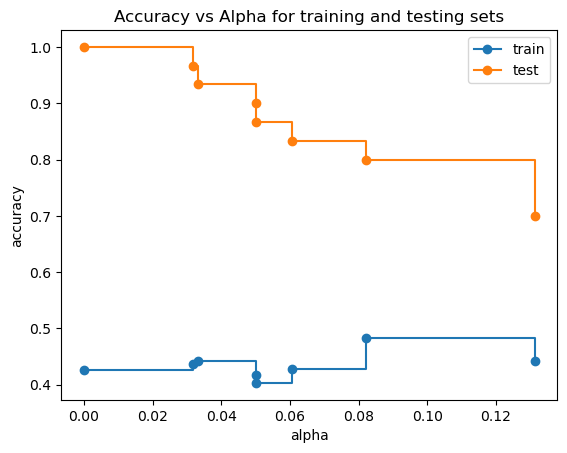

In [115]:
fig,ax=plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs Alpha for training and testing sets")
ax.plot(ccp_alphas, test_score, marker='o', label='train', drawstyle="steps-post")
ax.plot(ccp_alphas, train_score, marker='o', label='test', drawstyle="steps-post")

ax.legend()
plt.show()


# The difference between the training dataset and test dataset is very high. The training dataset(30 rows) is very low as compare to test dataset(around 500). That's why we are getting the huge difference between the train and test dataset in above graph.

# to increase the accuracy or decrease the difference between the train and test dataset accuracy we can increase the volume of the training dataset

# It will increase the number of ccp_alpha also

# ccp_alphas is a hyper-parameter used to control the complexity of a decision tree model. It is a non-negative float that determines how many nodes of the tree to prune. A higher value of CCP alpha will result in a more pruned tree, which means that the tree will have fewer nodes and will be less complex.

In [116]:
df2=df.head(500)

In [117]:
x2=df2.drop(columns="quality")
y2=df2.quality

[Text(0.4626834753787879, 0.9722222222222222, 'x[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.2948626893939394, 0.9166666666666666, 'x[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.18631628787878787, 0.8611111111111112, 'x[2] <= 0.415\ngini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.08475378787878787, 0.8055555555555556, 'x[10] <= 9.05\ngini = 0.525\nsamples = 131\nvalue = [0, 8, 81, 39, 3, 0]'),
 Text(0.030303030303030304, 0.75, 'x[9] <= 0.54\ngini = 0.403\nsamples = 12\nvalue = [0, 2, 1, 9, 0, 0]'),
 Text(0.022727272727272728, 0.6944444444444444, 'x[8] <= 3.43\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1, 0, 0, 0]'),
 Text(0.015151515151515152, 0.6388888888888888, 'gini = 0.0\nsamples = 2\nvalue = [0, 2, 0, 0, 0, 0]'),
 Text(0.030303030303030304, 0.6388888888888888, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1, 0, 0, 0]'),
 Text(0.03787878787878788, 0.6944444444444444, 'gini = 0.0\nsample

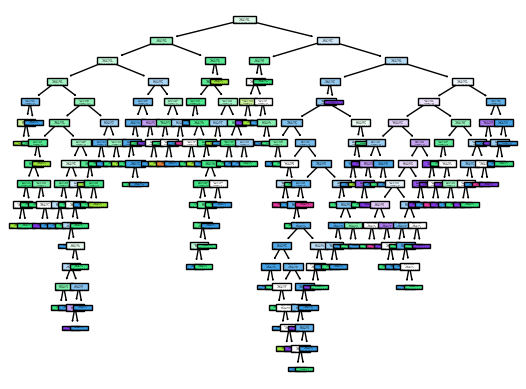

In [118]:
dt_model1= DecisionTreeClassifier()
dt_model1.fit(x2,y2)
tree.plot_tree(dt_model1, filled=True)

#  Creating another decision tree model with same dataset but having different ccp_alpha values ie 0.014 which will act as threshold and by Accuracy vs Alpha for training and testing sets graph we decided to keep the ccp alpha =0.014 (500) data set

In [119]:
dt_model_ccp=DecisionTreeClassifier(random_state=0, ccp_alpha=0.014)
dt_model_ccp.fit(x2,y2)

DecisionTreeClassifier(ccp_alpha=0.014, random_state=0)

[Text(0.5, 0.8333333333333334, 'x[10] <= 9.85\ngini = 0.624\nsamples = 500\nvalue = [1, 16, 239, 184, 52, 8]'),
 Text(0.25, 0.5, 'x[6] <= 62.5\ngini = 0.504\nsamples = 259\nvalue = [1, 12, 167, 72, 6, 1]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.576\nsamples = 169\nvalue = [1, 9, 91, 61, 6, 1]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.271\nsamples = 90\nvalue = [0, 3, 76, 11, 0, 0]'),
 Text(0.75, 0.5, 'x[9] <= 0.545\ngini = 0.657\nsamples = 241\nvalue = [0, 4, 72, 112, 46, 7]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.408\nsamples = 32\nvalue = [0, 2, 24, 5, 1, 0]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.638\nsamples = 209\nvalue = [0, 2, 48, 107, 45, 7]')]

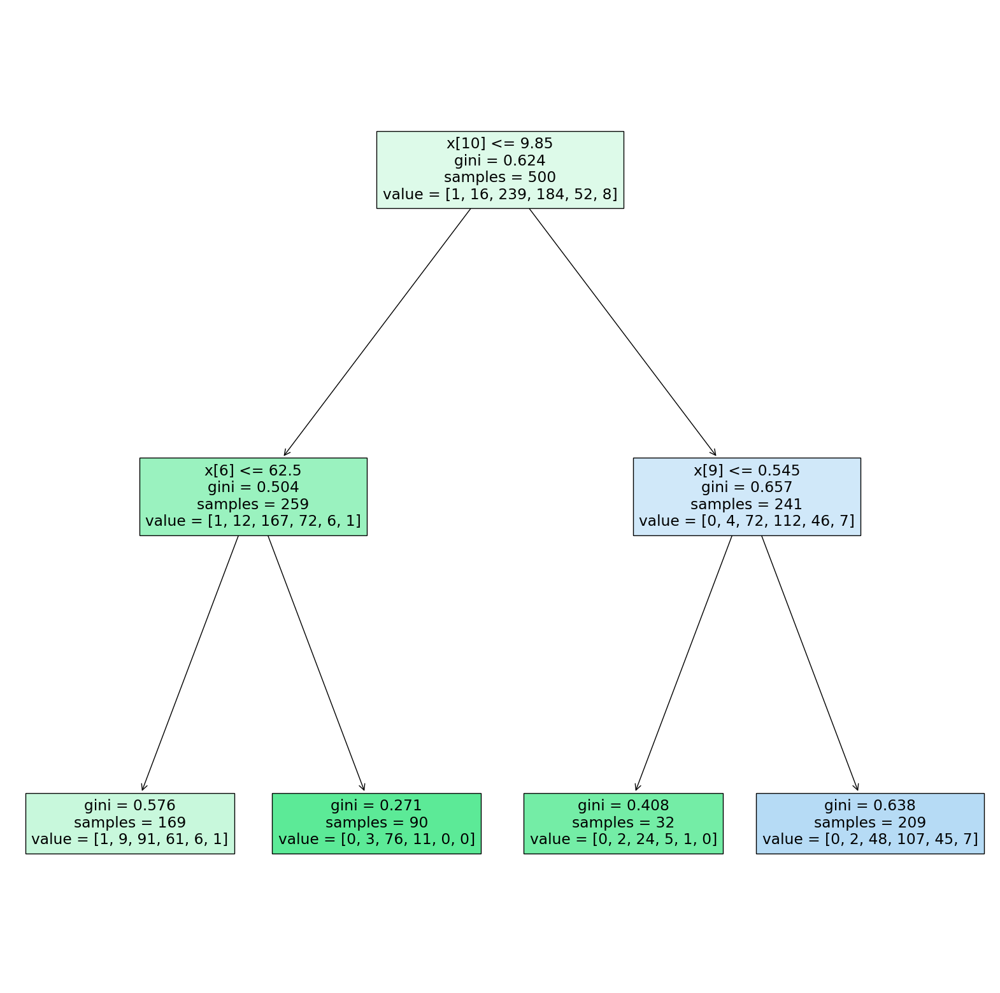

In [120]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_ccp, filled=True)

In [121]:
dt_model_ccp.score(x2,y2) # x2 & y2 having only 500 data

0.596

In [122]:
dt_model_ccp.score(x_test,y_test)

0.5864583333333333

In [123]:
dt_model_ccp.score(x1,y1) # x1 & y1 having only 30 data

0.6333333333333333

In [124]:
DecisionTreeClassifier()

DecisionTreeClassifier()

In [125]:
grid_pram = {"criterion":['gini','entropy'],
             "splitter":['best','random'],
             "max_depth" : range(2,40,1),
             "min_samples_split":range(2,10 ,1),
             "min_samples_leaf":range(1,10,1),
             'ccp_alpha':np.random.rand(20)
             }

In [126]:
grid_ccp=GridSearchCV(estimator=dt_model_ccp,param_grid=grid_pram, cv=5, n_jobs=-1)

In [127]:
grid_ccp.fit(x1,y1)

C:\Users\arvin\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:725: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=5.
  warnings.warn(


GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.014, random_state=0),
             n_jobs=-1,
             param_grid={'ccp_alpha': array([0.21954343, 0.5827525 , 0.27231985, 0.48660707, 0.05146608,
       0.4385178 , 0.37192906, 0.71698167, 0.46848699, 0.35989458,
       0.11750159, 0.82597274, 0.02535757, 0.69316397, 0.6253756 ,
       0.48710923, 0.53702838, 0.04707733, 0.28986201, 0.66198591]),
                         'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': range(1, 10),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [128]:
grid_ccp.best_params_

{'ccp_alpha': 0.21954342984237074,
 'criterion': 'entropy',
 'max_depth': 2,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'random'}

In [129]:
grid_model= DecisionTreeClassifier(ccp_alpha=0.21954342984237074,criterion='entropy',max_depth=2,min_samples_leaf=2,min_samples_split=2,splitter='random')

In [130]:
grid_model.fit(x1,y1)

DecisionTreeClassifier(ccp_alpha=0.21954342984237074, criterion='entropy',
                       max_depth=2, min_samples_leaf=2, splitter='random')

[Text(0.5, 0.75, 'x[2] <= 0.361\nentropy = 1.287\nsamples = 30\nvalue = [1, 21, 5, 3]'),
 Text(0.25, 0.25, 'entropy = 0.999\nsamples = 26\nvalue = [1, 21, 2, 2]'),
 Text(0.75, 0.25, 'entropy = 0.811\nsamples = 4\nvalue = [0, 0, 3, 1]')]

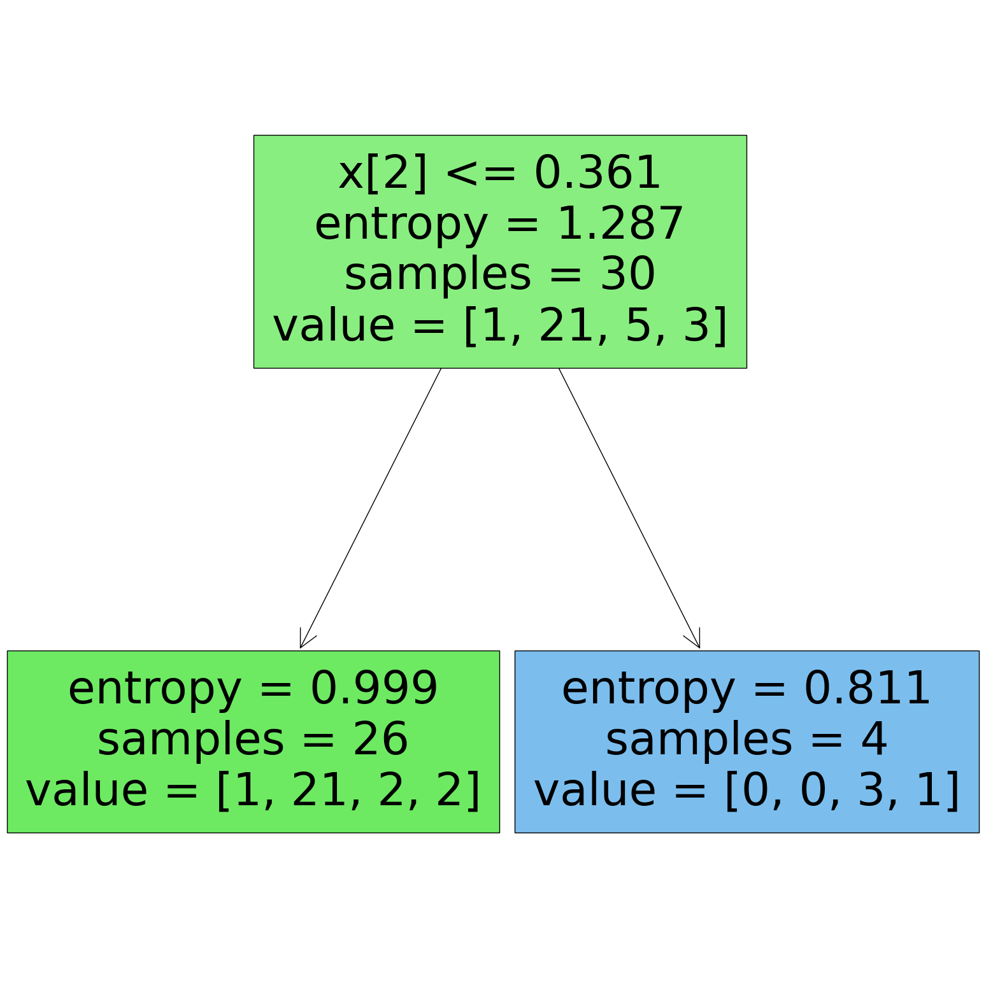

In [131]:
plt.figure(figsize=(20,20))
tree.plot_tree(grid_model, filled=True )

In [132]:
grid_model.score(x1,y1)

0.8

In [134]:
grid_model.score(x_test, y_test)

0.48541666666666666

In [135]:
pred=grid_model.predict(x_train)

In [136]:
confusion_matrix(y_train,pred)

array([[  0,   0,   1,   2,   0,   0],
       [  0,   0,  19,   6,   0,   0],
       [  0,   0, 196,  61,   0,   0],
       [  0,   0, 178,  80,   0,   0],
       [  0,   0,  28,  58,   0,   0],
       [  0,   0,   3,   7,   0,   0]], dtype=int64)

# Bagging Technique

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.linear_model import ElasticNetCV, ElasticNet, LassoCV, Lasso, RidgeCV, Ridge
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score
from sklearn import tree
import sklearn
from ydata_profiling import profile_report
%matplotlib inline

In [3]:
df=pd.read_csv("winequality-red.csv")

In [4]:
df.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chloride,free sulphur dioxide,total sulphur dioxide,density,PH,sulphate,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [5]:
xb=df.drop(columns=['quality'])
yb=df.quality

In [6]:
x_train, x_test, y_train, y_test=train_test_split(xb,yb,random_state=0)

In [7]:
bag_dt=BaggingClassifier(DecisionTreeClassifier(), n_estimators=10) # no of tree inside a bag is 10 type is Decision

In [8]:
bag_dt.fit(x_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier())

In [9]:
bag_dt.score(x_test, y_test)

0.6475

In [10]:
bag_dt.predict(x_test)

array([6, 5, 7, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5, 5, 6, 7, 7, 5, 5, 6, 6, 5,
       6, 6, 5, 5, 5, 7, 5, 6, 6, 5, 6, 5, 7, 7, 5, 5, 6, 6, 5, 7, 7, 7,
       6, 5, 5, 6, 5, 6, 5, 5, 6, 6, 6, 5, 5, 5, 7, 5, 5, 6, 6, 6, 5, 6,
       5, 5, 7, 6, 5, 5, 5, 5, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 6, 5, 6, 5,
       5, 5, 5, 6, 7, 5, 6, 5, 6, 5, 5, 6, 7, 7, 6, 6, 5, 5, 5, 6, 6, 5,
       6, 5, 7, 6, 6, 6, 6, 7, 6, 6, 5, 6, 6, 5, 6, 6, 5, 5, 6, 7, 5, 5,
       6, 6, 6, 5, 6, 5, 6, 5, 6, 5, 5, 6, 5, 6, 7, 6, 5, 5, 5, 6, 6, 5,
       6, 6, 6, 5, 6, 7, 6, 5, 7, 6, 5, 5, 6, 6, 6, 6, 6, 6, 6, 7, 7, 6,
       5, 7, 7, 5, 5, 7, 6, 6, 7, 5, 6, 6, 5, 6, 6, 5, 5, 6, 5, 5, 5, 6,
       5, 5, 5, 6, 6, 6, 5, 5, 5, 6, 6, 6, 6, 6, 5, 7, 5, 6, 6, 6, 6, 5,
       5, 6, 6, 6, 5, 6, 6, 6, 6, 5, 5, 6, 6, 5, 7, 6, 6, 7, 7, 6, 5, 6,
       5, 5, 6, 5, 5, 5, 5, 7, 5, 5, 5, 5, 5, 6, 5, 5, 5, 7, 6, 6, 5, 6,
       5, 5, 5, 5, 6, 7, 5, 5, 5, 5, 7, 6, 6, 6, 6, 7, 5, 7, 5, 6, 6, 5,
       5, 5, 7, 6, 5, 5, 6, 6, 5, 6, 6, 5, 5, 5, 6,

In [11]:
bag_dt.estimator_

DecisionTreeClassifier()

In [12]:
bag_dt.estimator

DecisionTreeClassifier()

In [13]:
bag_dt.classes_

array([3, 4, 5, 6, 7, 8], dtype=int64)

In [14]:
bag_dt.estimator_params

()

In [18]:
from sklearn.neighbors import KNeighborsClassifier

In [19]:
bag_knn=BaggingClassifier(KNeighborsClassifier(6), n_estimators=10)  # 6 is the value of K

In [20]:
bag_knn.fit(x_train,y_train)

BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=6))

In [21]:
bag_knn.score(x_test,y_test)

0.465

In [22]:
bag_knn.predict(x_test)

array([5, 6, 7, 6, 6, 6, 6, 6, 6, 6, 5, 6, 5, 6, 6, 5, 7, 6, 5, 5, 6, 6,
       6, 5, 5, 5, 5, 6, 5, 6, 6, 6, 6, 6, 6, 7, 5, 6, 6, 6, 6, 7, 6, 5,
       6, 6, 5, 6, 5, 5, 6, 5, 7, 7, 5, 5, 5, 5, 7, 5, 5, 6, 6, 5, 5, 5,
       5, 6, 7, 7, 5, 5, 5, 5, 6, 6, 5, 6, 5, 6, 5, 5, 4, 6, 6, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 5, 7, 5, 5, 6, 6, 6, 6, 6, 6, 5,
       6, 5, 6, 6, 5, 7, 5, 7, 7, 6, 5, 7, 6, 5, 7, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 6, 5, 6, 5, 6, 5, 7, 6, 5, 6, 5, 6, 6, 6, 5, 6, 5, 5, 6, 6,
       6, 6, 5, 6, 6, 6, 5, 6, 5, 6, 6, 5, 6, 5, 6, 5, 5, 7, 6, 7, 7, 5,
       7, 7, 7, 5, 5, 6, 6, 5, 7, 5, 6, 5, 5, 6, 5, 5, 5, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 6, 5, 5, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 6, 5, 5,
       5, 5, 7, 6, 5, 5, 5, 5, 5, 4, 5, 6, 5, 5, 6, 6, 7, 6, 7, 6, 6, 5,
       6, 6, 5, 5, 5, 5, 5, 5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 5, 6, 6, 5,
       5, 5, 6, 5, 6, 5, 5, 5, 6, 5, 6, 6, 5, 5, 6, 7, 6, 6, 5, 5, 5, 5,
       5, 5, 6, 6, 6, 5, 5, 6, 5, 6, 5, 5, 5, 5, 5,

In [23]:
from sklearn.ensemble import RandomForestClassifier

In [24]:
rf=RandomForestClassifier(n_estimators=5)

In [25]:
rf.fit(x_train, y_train)

RandomForestClassifier(n_estimators=5)

In [26]:
rf.score(x_test,y_test)

0.63

In [27]:
bag_knn.score(x_test,y_test)

0.465

In [28]:
bag_dt.score(x_test,y_test)

0.665

In [29]:
ls=[rf.estimators_]

[Text(0.5540178571428571, 0.9375, 'x[10] <= 10.525\ngini = 0.657\nsamples = 780\nvalue = [10, 44, 501, 455, 181, 8]'),
 Text(0.325, 0.8125, 'x[5] <= 14.5\ngini = 0.555\nsamples = 480\nvalue = [4, 29, 424, 231, 38, 1]'),
 Text(0.175, 0.6875, 'x[1] <= 0.405\ngini = 0.597\nsamples = 233\nvalue = [1, 15, 173, 145, 23, 1]'),
 Text(0.09642857142857143, 0.5625, 'x[9] <= 0.645\ngini = 0.585\nsamples = 49\nvalue = [0, 0, 19, 42, 12, 1]'),
 Text(0.05357142857142857, 0.4375, 'x[2] <= 0.475\ngini = 0.499\nsamples = 17\nvalue = [0, 0, 14, 13, 0, 0]'),
 Text(0.02857142857142857, 0.3125, 'x[1] <= 0.335\ngini = 0.43\nsamples = 9\nvalue = [0, 0, 5, 11, 0, 0]'),
 Text(0.014285714285714285, 0.1875, 'x[0] <= 6.45\ngini = 0.219\nsamples = 3\nvalue = [0, 0, 1, 7, 0, 0]'),
 Text(0.007142857142857143, 0.0625, '\n  (...)  \n'),
 Text(0.02142857142857143, 0.0625, '\n  (...)  \n'),
 Text(0.04285714285714286, 0.1875, 'x[8] <= 3.375\ngini = 0.5\nsamples = 6\nvalue = [0, 0, 4, 4, 0, 0]'),
 Text(0.03571428571428571,

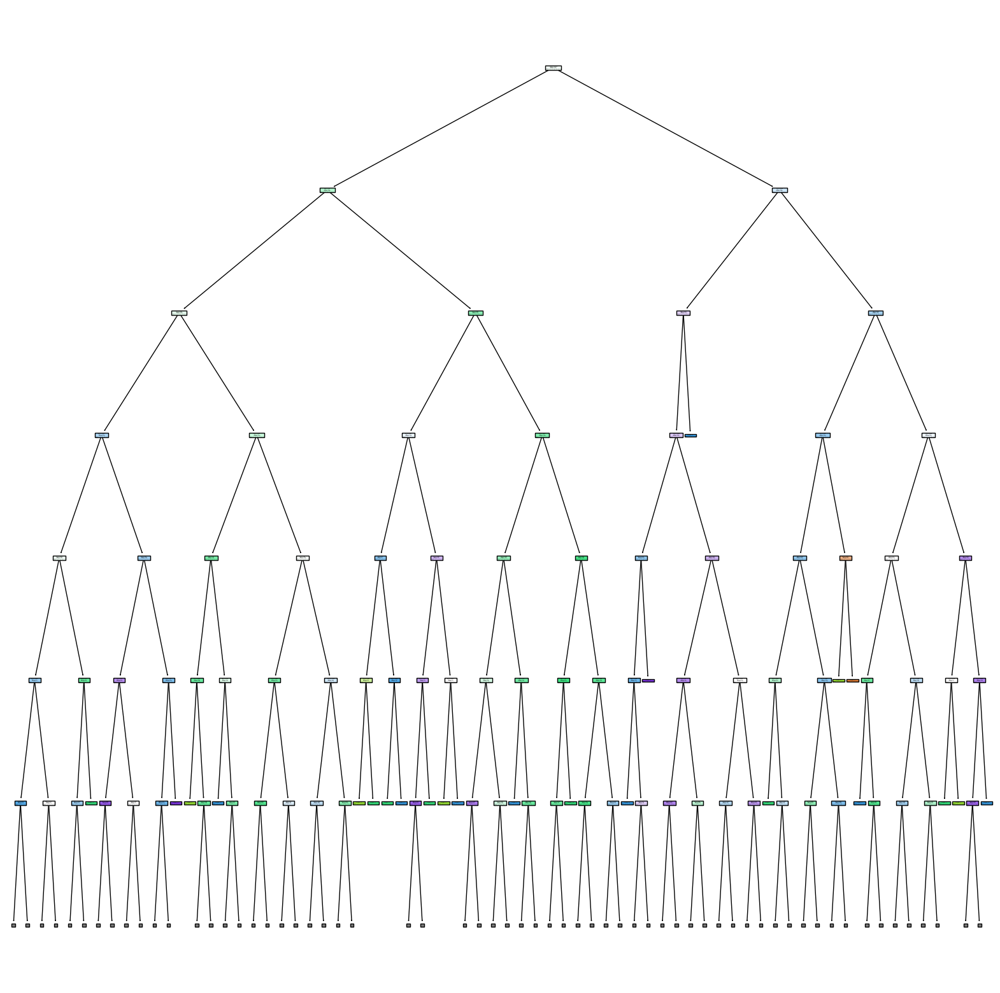

In [29]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[0], filled=True, max_depth=6)

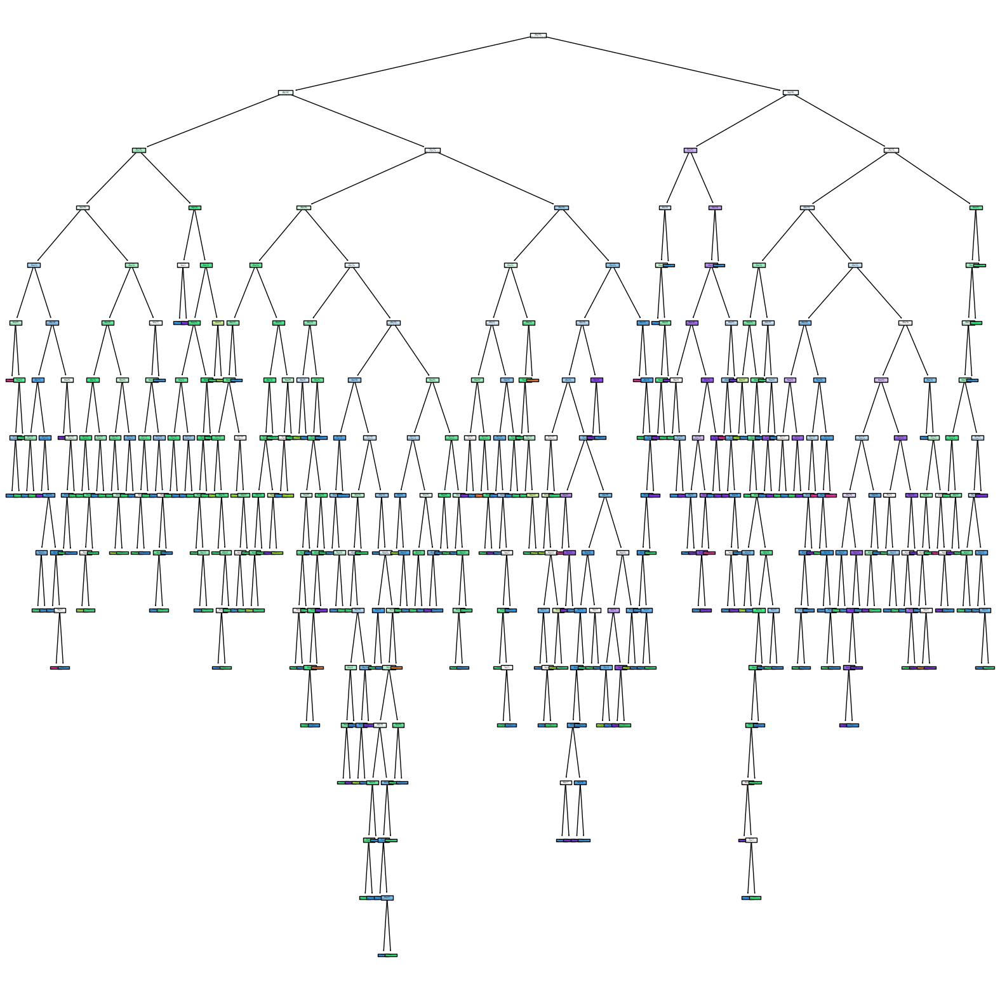

In [30]:
plt.figure(figsize=(20,20))
for i in range(len(rf.estimators_)):
    tree.plot_tree(rf.estimators_[i], filled=True)

In [31]:
for i in range(len(rf.estimators_)):
    print("Decision tree", i,rf.estimators_[i])

Decision tree 0 DecisionTreeClassifier(max_features='sqrt', random_state=1509788681)
Decision tree 1 DecisionTreeClassifier(max_features='sqrt', random_state=1079564521)
Decision tree 2 DecisionTreeClassifier(max_features='sqrt', random_state=1419674324)
Decision tree 3 DecisionTreeClassifier(max_features='sqrt', random_state=1545806118)
Decision tree 4 DecisionTreeClassifier(max_features='sqrt', random_state=58433959)


[Text(0.5384455315420561, 0.9705882352941176, 'x[2] <= 0.335\ngini = 0.644\nsamples = 759\nvalue = [7, 31, 507, 479, 157, 18]'),
 Text(0.2818268107476635, 0.9117647058823529, 'x[8] <= 3.295\ngini = 0.596\nsamples = 510\nvalue = [6, 28, 385, 340, 46, 8]'),
 Text(0.1324766355140187, 0.8529411764705882, 'x[5] <= 20.5\ngini = 0.525\nsamples = 154\nvalue = [0, 5, 145, 79, 6, 5]'),
 Text(0.07570093457943926, 0.7941176470588235, 'x[1] <= 0.545\ngini = 0.568\nsamples = 110\nvalue = [0, 3, 86, 74, 5, 5]'),
 Text(0.026168224299065422, 0.7352941176470589, 'x[3] <= 1.85\ngini = 0.578\nsamples = 45\nvalue = [0, 0, 18, 39, 5, 5]'),
 Text(0.007476635514018692, 0.6764705882352942, 'x[7] <= 0.995\ngini = 0.571\nsamples = 9\nvalue = [0, 0, 8, 2, 0, 4]'),
 Text(0.003738317757009346, 0.6176470588235294, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 0, 0, 0, 4]'),
 Text(0.011214953271028037, 0.6176470588235294, 'x[4] <= 0.076\ngini = 0.32\nsamples = 8\nvalue = [0, 0, 8, 2, 0, 0]'),
 Text(0.007476635514018692, 0

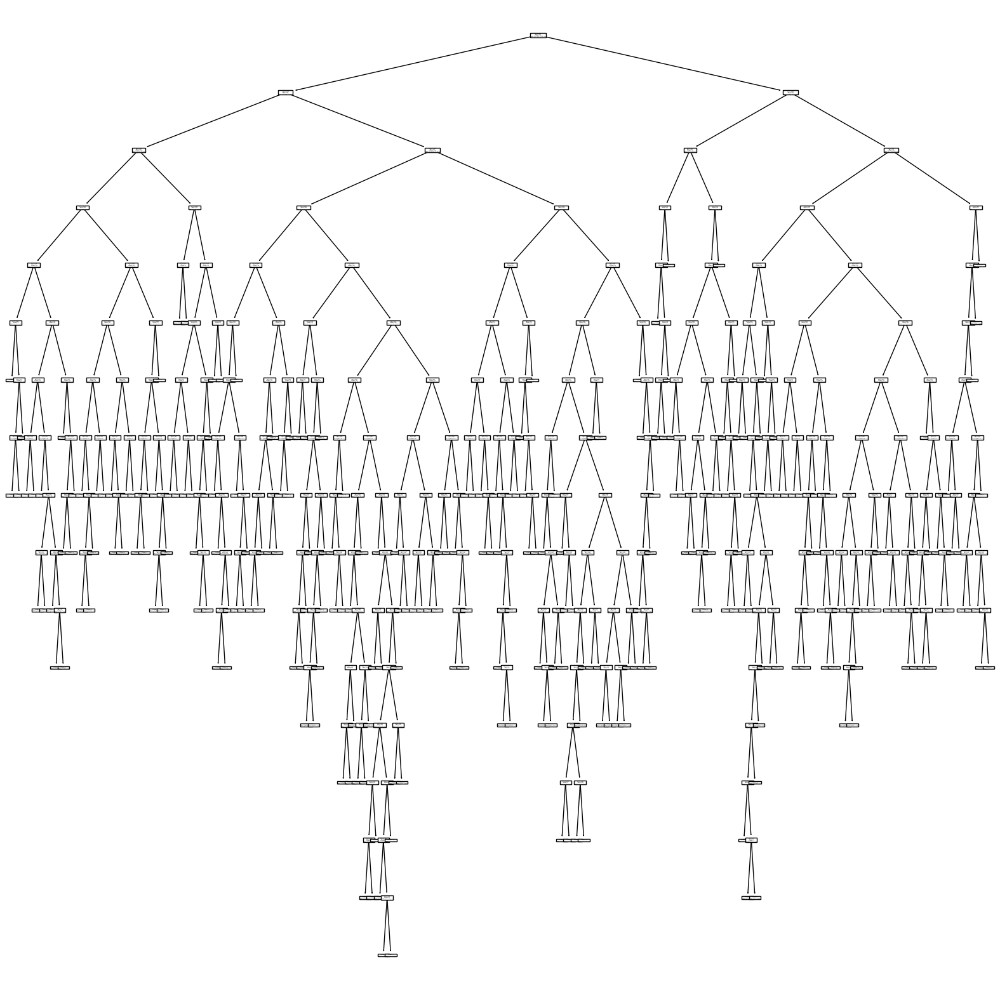

In [32]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf.estimators_[4])

In [34]:
grid_pram={
    "n_estimators": [5,10,50,100,120,150],
    "criterion" : ['gini','entropy'],
    'max_depth' : range(10),
    'min_samples_leaf' : range(10)
}

In [35]:
rf=RandomForestClassifier(n_estimators=5)

In [36]:
grid_search_rf=GridSearchCV(n_jobs=-1 ,estimator=rf, param_grid= grid_pram, cv=5, verbose=1)

In [37]:
grid_search_rf.fit(x_train,y_train)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits


C:\Users\arvin\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
1140 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
600 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\arvin\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\arvin\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\arvin\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\arvin\anaconda3\Lib\site-pack

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_estimators=5), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(0, 10),
                         'min_samples_leaf': range(0, 10),
                         'n_estimators': [5, 10, 50, 100, 120, 150]},
             verbose=1)

In [38]:
grid_search_rf.best_params_

{'criterion': 'entropy',
 'max_depth': 9,
 'min_samples_leaf': 1,
 'n_estimators': 150}

In [39]:
rf_new = RandomForestClassifier(n_estimators=120,criterion='entropy', max_depth=9, min_samples_leaf=1)

In [40]:
rf_new.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, n_estimators=120)

In [41]:
rf_new.score(x_test,y_test)

0.6725

In [42]:
rf.score(x_test,y_test)

NotFittedError: This RandomForestClassifier instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

[Text(0.5009702457956016, 0.95, 'x[9] <= 0.585\nentropy = 1.704\nsamples = 741\nvalue = [11, 34, 519, 464, 162, 9]'),
 Text(0.21951811125485124, 0.85, 'x[10] <= 11.05\nentropy = 1.404\nsamples = 291\nvalue = [8, 24, 299, 115, 17, 0]'),
 Text(0.11691461836998707, 0.75, 'x[9] <= 0.525\nentropy = 1.148\nsamples = 236\nvalue = [8, 14, 275, 82, 2, 0]'),
 Text(0.05886157826649418, 0.65, 'x[4] <= 0.127\nentropy = 1.011\nsamples = 107\nvalue = [5, 9, 135, 21, 0, 0]'),
 Text(0.040103492884864166, 0.55, 'x[1] <= 0.315\nentropy = 0.907\nsamples = 103\nvalue = [1, 9, 131, 21, 0, 0]'),
 Text(0.03492884864165589, 0.45, 'entropy = 0.0\nsamples = 2\nvalue = [0, 0, 0, 5, 0, 0]'),
 Text(0.045278137128072445, 0.45, 'x[5] <= 17.5\nentropy = 0.837\nsamples = 101\nvalue = [1, 9, 131, 16, 0, 0]'),
 Text(0.02328589909443726, 0.35, 'x[10] <= 9.05\nentropy = 1.032\nsamples = 66\nvalue = [1, 9, 77, 12, 0, 0]'),
 Text(0.01034928848641656, 0.25, 'x[0] <= 7.75\nentropy = 0.811\nsamples = 2\nvalue = [0, 3, 0, 1, 0, 

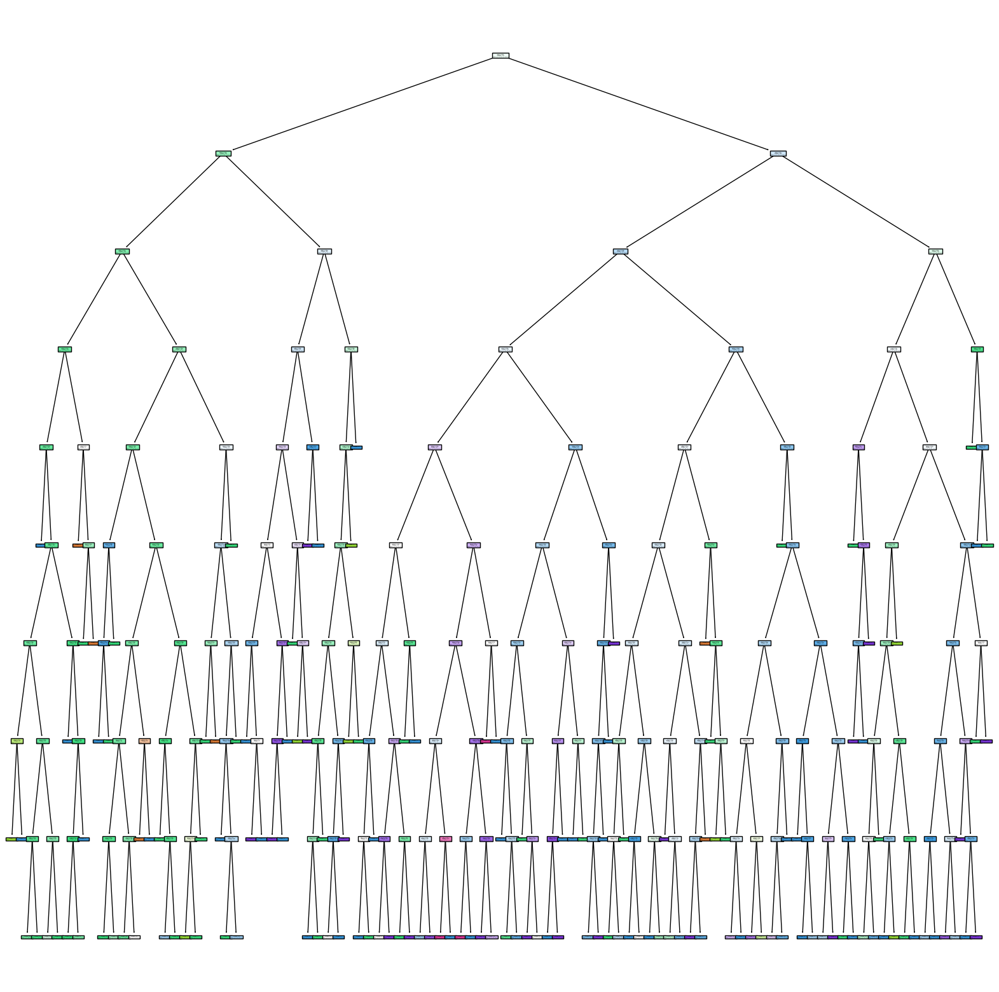

In [174]:
plt.figure(figsize=(20,20))
tree.plot_tree(rf_new.estimators_[0], filled=True)